# 목차
1. 데이터셋 구성하기
 - 데이터 시각화
 - 데이터 Normalization
 - 데이터셋 구성
2. 생성자 모델 구현하기
3. 판별자 모델 구현하기
4. 손실함수와 최적화 함수 구현하기
 - 손실함수
 - 정확도 판단 함수
 - 최적화 함수
5. 상세 기능 구현하기
 - 미니배치 훈련 함수
 - 이미지 시각화 함수
 - 히스토리 시각화 함수
 - 체크포인트 모듈 설정
6. 학습과정 진행하기
 - 이전 학습 결과
 - 마지막 학습 결과
7. 회고
 
고려할 점
- 이미지 데이터의 shape가 (28, 28, 1)에서 (32, 32, 3)으로 변경됩니다. 생성자, 판별자 모델의 입출력 shape 및 모델 구조에 영향이 있습니다.
- 이미지가 단색의 grayscale에서 RGB 3채널의 컬러이미지로 변경됩니다. 시각화 과정에서 고려할 점이 있습니다.
- 입력데이터 전체 차원이 3~4배 증가하면서, 학습이 진행되는 양상이 다소 달라집니다.

In [1]:
import os
import glob
import time

import PIL
import imageio
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
from IPython import display
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
# 생성자가 생성한 샘플을 확인할 노이즈 벡터 미리 생성

noise_dim = 100
num_examples_to_generate = 16

seed = tf.random.normal([num_examples_to_generate, noise_dim])
seed.shape

TensorShape([16, 100])

In [3]:
# 변수 모음

# 데이터셋 구성 관련
BUFFER_SIZE = 50000             # 전체 데이터 셋 크기만큼 설정
BATCH_SIZE = 512                # 한번에 학습할 데이터의 양

# 모델 구성 관련
DIM, DEPTH = 4, 64
DROPOUT = 0.3                   # 생성자
ALPHA = 0.2                     # LeakyReLU
G_init, D_init,  = 1e-4, 1e-3 
BETA_1, DECAY = 0.5, 1e-5       # beta1: 이전 결과가 영향을 주는 정도
                                # decay: 업데이트마다 적용되는 학습률의 감소율

# 학습 관련
save_every = 100                # 100번마다 checkpoint
EPOCHS = 2000                   # 학습횟수

# 데이터셋 구성하기

In [4]:
# CIFAR-10 이미지 가져오기

cifar10 = tf.keras.datasets.cifar10

(train_x, _), (test_x, _) = cifar10.load_data() # 라벨을 제외한 이미지 데이터만

train_x.shape

170500096/170498071 [==============================] - 3s 0us/step


(50000, 32, 32, 3)

In [5]:
# 이미지 픽셀 확인

print("max pixel:", train_x.max())
print("min pixel:", train_x.min())

max pixel: 255
min pixel: 0


In [6]:
# 데이터셋의 sahpe 확인

train_x.shape

(50000, 32, 32, 3)

In [7]:
img_size = train_x.shape[1:]
img_size

(32, 32, 3)

## 데이터 시각화

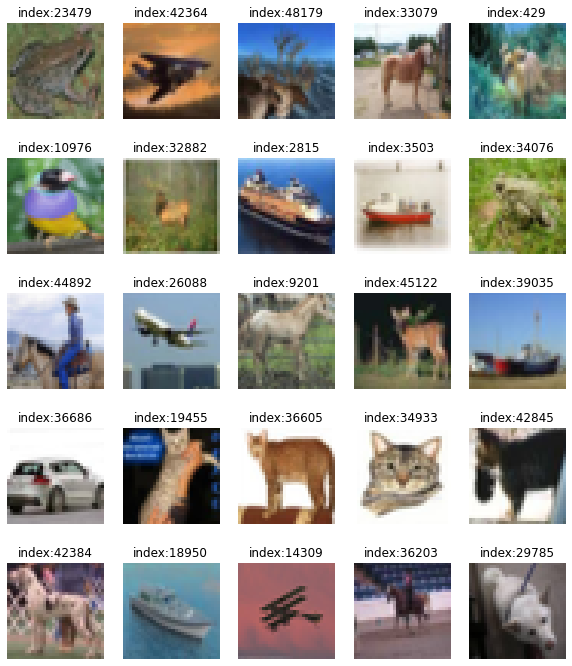

In [8]:
# 로드한 데이터 시각화

plt.figure(figsize=(10, 12))

for i in range(25):
    n = np.random.randint(train_x.shape[0])
    plt.subplot(5, 5, i+1)
    plt.imshow(train_x[n].reshape(img_size))
    plt.title(f'index:{n}')
    plt.axis('off')
plt.show()

## 데이터 Normalization

In [9]:
# 이미지를 [-1, 1]로 정규화

train_x = (train_x - 127.5) / 127.5 

print("max pixel:", train_x.max())
print("min pixel:", train_x.min())

max pixel: 1.0
min pixel: -1.0


## 데이터셋 구성

In [10]:
# 미니 배치 데이터셋 구성

train_dataset = tf.data.Dataset.from_tensor_slices(train_x).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

# 생성자 모델 구현하기

basic ver.
>`(8, 8, 256) → (8, 8, 128) → (16, 16, 64) → (32, 32, 3)`

modified ver.
>`(4, 4, 512) → (4, 4, 256) → (8, 8, 128) → (16, 16, 64) → (32, 32, 3)`

```
def make_generator_model(): # basic ver.

    # Start
    model = tf.keras.Sequential()

    # First: Dense layer
    model.add(layers.Dense(8*8*DEPTH*4, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Second: Reshape layer
    model.add(layers.Reshape((8, 8, DEPTH*4)))
        # model.output_shape == (BACHE_SIZE, 8, 8, 256)

    # Third: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(DEPTH*2, kernel_size=(5, 5), strides=(1, 1), padding='same', use_bias=False))
        # model.output_shape == (BACHE_SIZE, 8, 8, 128)
    model.add(layers.BatchNormalization(momentum=0.9))
    model.add(layers.LeakyReLU())

    # Fourth: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(DEPTH, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False))
        # model.output_shape == (BACHE_SIZE, 16, 16, 64)
    model.add(layers.BatchNormalization(momentum=0.9))
    model.add(layers.LeakyReLU())

    # Fifth: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(3, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False, \
                                     activation='tanh'))
        # model.output_shape == (BACHE_SIZE, 32, 32, 3)

    return model
```

In [11]:
def make_generator_model(): # modified ver.

    # Start
    model = tf.keras.Sequential()

    # First: Dense layer
    model.add(layers.Dense(DIM*DIM*DEPTH*8, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Second: Reshape layer
    model.add(layers.Reshape((DIM, DIM, DEPTH*8)))
        # model.output_shape == (BACHE_SIZE, 4, 4, 512)

    # Third: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(DEPTH*4, kernel_size=(5, 5), strides=(1, 1), padding='same', use_bias=False))
        # model.output_shape == (BACHE_SIZE, 4, 4, 256)
    model.add(layers.BatchNormalization(momentum=0.9))
    model.add(layers.LeakyReLU())

    # Fourth: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(DEPTH*2, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False))
        # model.output_shape == (BACHE_SIZE, 8, 8, 128)
    model.add(layers.BatchNormalization(momentum=0.9))
    model.add(layers.LeakyReLU())

    # Fifth: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(DEPTH, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False))
        # model.output_shape == (BACHE_SIZE, 16, 16, 64)
    model.add(layers.BatchNormalization(momentum=0.9))
    model.add(layers.LeakyReLU())    

    # Sixth: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(3, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False, \
                                     activation='tanh'))
        # model.output_shape == (BACHE_SIZE, 32, 32, 3)

    return model

In [12]:
# 모델의 세부 내용 출력

generator = make_generator_model()

generator.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8192)              819200    
_________________________________________________________________
batch_normalization (BatchNo (None, 8192)              32768     
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 8192)              0         
_________________________________________________________________
reshape (Reshape)            (None, 4, 4, 512)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 4, 4, 256)         3276800   
_________________________________________________________________
batch_normalization_1 (Batch (None, 4, 4, 256)         1024      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 4, 4, 256)         0

In [13]:
# 랜덤 이미지 생성해서 shape 확인

noise = tf.random.normal([1, 100])

generated_image = generator(noise, training=False)
generated_image.shape

TensorShape([1, 32, 32, 3])

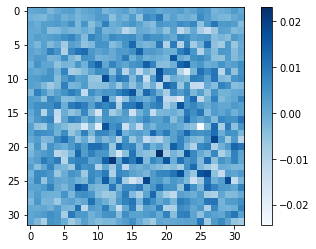

In [14]:
plt.imshow(generated_image[0, :, :, 0], cmap='Blues')
plt.colorbar()
plt.show()

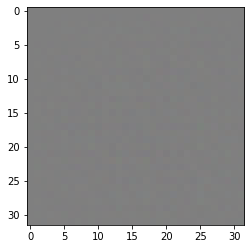

In [15]:
# 시각화 시키기 위해 [0, 225]로 픽셀 조정
# 잘 안 보인다

temp = generated_image.numpy()
temp = (temp * 127.5) + 127.5
temp = temp.astype(int)
plt.imshow(temp[0])
plt.show()

# 판별자 모델 구현하기

`(32, 32, 3) → (16, 16, 64) → (8, 8, 128)`

In [16]:
def make_discriminator_model():

    # Start
    model = tf.keras.Sequential()

    # First: Conv2D Layer
    model.add(layers.Conv2D(DEPTH, (5, 5), strides=(2, 2), padding='same', input_shape=[32, 32, 3]))
    model.add(layers.LeakyReLU(ALPHA))
    model.add(layers.Dropout(DROPOUT))

    # Second: Conv2D Layer
    model.add(layers.Conv2D(DEPTH*2, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(ALPHA))
    model.add(layers.Dropout(DROPOUT))

    # Third: Flatten Layer
    model.add(layers.Flatten())

    # Fourth: Dense Layer
    model.add(layers.Dense(1))

    return model

In [17]:
# 모델의 세부 내용 출력

discriminator = make_discriminator_model()

discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 16, 16, 64)        4864      
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 16, 16, 64)        0         
_________________________________________________________________
dropout (Dropout)            (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 8, 8, 128)         204928    
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 8, 8, 128)         0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 8, 8, 128)         0         
_________________________________________________________________
flatten (Flatten)            (None, 8192)             

In [18]:
# 가짜 이미지를 입력시켜서 결과 확인

decision = discriminator(generated_image, training=False)
decision

<tf.Tensor: shape=(1, 1), dtype=float32, numpy=array([[-0.00026111]], dtype=float32)>

# 손실함수와 최적화 함수 구현하기

## 손실함수

In [19]:
# 크로스 엔트로피 조절
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(fake_output):  # 생성자의 손실함수
    return cross_entropy(tf.ones_like(fake_output), fake_output) # 가짜를 1로

def discriminator_loss(real_output, fake_output): # 판별자의 손실함수
    real_loss = cross_entropy(tf.ones_like(real_output), real_output) # 진짜를 1로
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output) # 가짜를 0으로
    total_loss = real_loss + fake_loss
    return total_loss

## 정확도 판단 함수

real accuracy와 fake accuracy는 초반에는 1.0에 가깝게 나오다가, 서서히 낮아져서 둘 다 0.5에 가까워지는 것이 이상적

ex.) real_output = tf.Tensor(0.2, 0.4, 0.7, 0.9) 라면,

- (1) tf.math.greater_equal(real_output, tf.constant(0.5) : real_output의 각 원소가 0.5 이상인지 True, False로 판별 - `>> tf.Tensor([False, False, True, True])`
- (2) tf.cast( (1), tf.float32) : (1)의 결과가 True이면 1.0, False이면 0.0으로 변환 - `>> tf.Tensor([0.0, 0.0, 1.0, 1.0])`
- (3) tf.reduce_mean( (2)) : (2)의 결과를 평균내어 이번 배치의 정확도(accuracy)를 계산 - `>> 0.5`

즉, 전체 중의 절반만 맞출수 있게, 동전을 던져서 찍는것과 비슷한 수준으로 만들고 싶다!

In [20]:
# 정확도 판단 함수

def discriminator_accuracy(real_output, fake_output):
    real_accuracy = tf.reduce_mean(tf.cast(tf.math.greater_equal(real_output, tf.constant([0.5])), tf.float32))
    fake_accuracy = tf.reduce_mean(tf.cast(tf.math.less(fake_output, tf.constant([0.5])), tf.float32))
    return real_accuracy, fake_accuracy

## 최적화 함수

In [21]:
# 초기 lr은 1e-4 이지만 바꿔가며 해보기
# beta 설정 한다는걸 까먹었다 ㅠㅠ
generator_optimizer = tf.keras.optimizers.Adam(G_init, decay=DECAY)
discriminator_optimizer = tf.keras.optimizers.Adam(D_init, decay=DECAY)

# 상세 기능 구현하기

## 미니배치 훈련 함수

- (1) 입력데이터: Real Image 역할을 할 `images` 한 세트를 입력으로 받음
- (2) 생성자 입력 노이즈 : generator가 FAKE IMAGE를 생성하기 위한 `noise`를 `images` 한 세트와 같은 크기인 `BATCH_SIZE` 만큼 생성함
- (3) `tf.GradientTape()`는 가중치 갱신을 위한 Gradient를 자동 미분으로 계산하기 위해 `with` 구문 열기
- (4) generated_images 생성 : generator가 `noise`를 입력받은 후 `generated_images` 생성
- (5) discriminator 판별 : discriminator가 Real Image인 `images`와 Fake Image인 `generated_images`를 각각 입력받은 후 `real_output`, `fake_output` 출력
- (6) loss 계산 : `fake_output`, `real_output`으로 generator와 discriminator 각각의 loss 계산
- (7) accuracy 계산 : `fake_output`, `real_output`으로 discriminator가
- (8) gradient 계산 : `gen_tape`와 `disc_tape`를 활용해 gradient를 자동으로 계산
- (9) 모델 학습 : 계산된 gradient를 optimizer에 입력해 가중치 갱신
- (10) 리턴값 : 이번 스텝에 계산된 loss와 accuracy를 리턴

In [22]:
@tf.function
def train_step(images):  #(1) 입력데이터
    noise = tf.random.normal([BATCH_SIZE, noise_dim])  #(2) 생성자 입력 노이즈

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:  #(3) tf.GradientTape() 오픈
        generated_images = generator(noise, training=True)  #(4) generated_images 생성

        #(5) discriminator 판별
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        #(6) loss 계산
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

        #(7) accuracy 계산
        real_accuracy, fake_accuracy = discriminator_accuracy(real_output, fake_output) 
    
    #(8) gradient 계산
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    #(9) 모델 학습
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss, real_accuracy, fake_accuracy  #(10) 리턴값

## 이미지 시각화 함수

In [23]:
def generate_and_save_images(model, epoch, it, sample_seeds):

    predictions = model(sample_seeds, training=False)

    fig = plt.figure(figsize=(4, 4))
    for i in range(predictions.shape[0]):
        temp = predictions.numpy()
        temp = (temp * 127.5) + 127.5 # [0, 255]로 스케일링
        temp = temp.astype(int)
        plt.subplot(4, 4, i+1)
        plt.imshow(temp[i])
        #plt.imshow(predictions[i, :, :, 0], cmap='gray')
        plt.axis('off')

    plt.savefig('{}/aiffel/dcgan_newimage/cifar10/generated_samples/sample_epoch_{:04d}_iter_{:03d}.png'
                    .format(os.getenv('HOME'), epoch, it))
    plt.show()

## 히스토리 시각화 함수

In [24]:
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 20, 10    # matlab 차트의 기본 크기를 20,10으로 지정해 줍니다.

def draw_train_history(history, epoch):
    # summarize history for loss  
    plt.subplot(211)  
    plt.plot(history['disc_loss'])
    plt.plot(history['gen_loss'])  
    plt.title('model loss')  
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.legend(['DISC_loss', 'GEN_loss'], loc='upper left')  

    # summarize history for accuracy  
    plt.subplot(212)  
    plt.plot(history['real_accuracy'])  
    plt.plot(history['fake_accuracy']) 
    plt.title('discriminator accuracy')  
    plt.ylabel('accuracy')  
    plt.xlabel('batch iters')  
    plt.legend(['REAL_accuracy', 'FAKE_accuracy'], loc='upper left')  
    
    # training_history 디렉토리에 epoch별로 그래프를 이미지 파일로 저장합니다.
    plt.savefig('{}/aiffel/dcgan_newimage/cifar10/training_history/train_history_{:04d}.png'
                    .format(os.getenv('HOME'), epoch))
    plt.show()

## 체크포인트 모듈 설정

In [25]:
checkpoint_dir = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/training_checkpoints'

checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

# 학습과정 진행하기

## 학습하는 함수

In [26]:
# 학습하는 함수 만들기

def train(dataset, epochs, save_every):
    start = time.time()
    history = {'gen_loss':[], 'disc_loss':[], 'real_accuracy':[], 'fake_accuracy':[]}

    for epoch in range(epochs):
        epoch_start = time.time()
        for it, image_batch in enumerate(dataset):
            gen_loss, disc_loss, real_accuracy, fake_accuracy = train_step(image_batch)
            history['gen_loss'].append(gen_loss)
            history['disc_loss'].append(disc_loss)
            history['real_accuracy'].append(real_accuracy)
            history['fake_accuracy'].append(fake_accuracy)

            if it % 200 == 0: # 이미지는 200번 마다 저장
                display.clear_output(wait=True)
                generate_and_save_images(generator, epoch+1, it+1, seed)
                print('Epoch {} | iter {}'.format(epoch+1, it+1))
                print('Time for epoch {} : {} sec'.format(epoch+1, int(time.time()-epoch_start)))

        if (epoch + 1) % save_every == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

        display.clear_output(wait=True)
        generate_and_save_images(generator, epochs, it, seed)
        print('Time for training : {} sec'.format(int(time.time()-start)))

        draw_train_history(history, epoch)

## 이전 학습 결과

> basic ver. + BatchNormalization(momentum=0.9)

>모델 구성 관련
>- DEPTH = 64
>- DIM = 8
>- DROPOUT = 0.3
>- G_init = 1e-4
>- D_init = 1e-4

>학습 관련
>- save_every = 5
>- EPOCHS = 100

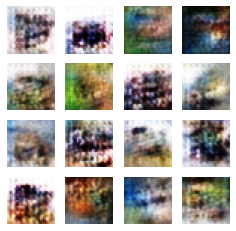


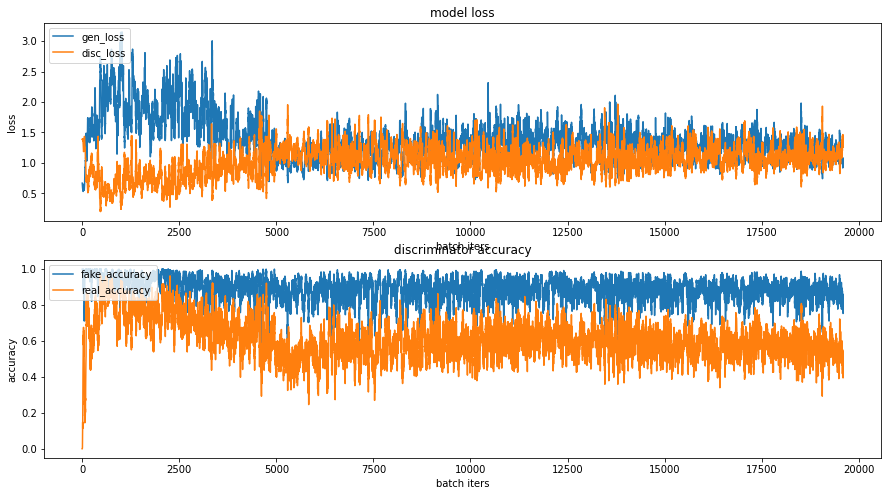

주어진 베이스 라인만으로 돌렸다고 생각했는데 다시 보니 BN의 momentum을 건드린 상태였다... ㅋㅋ

판별자가 너무 똑똑해서 제대로 학습이 진행되지 않는 것 같다! 생성자를 똑똑하게 만들어보자!


---
---

> Modified ver.

> 모델 구성 관련
>- DEPTH = 64
>- DIM = 4
>- DROPOUT = 0.3
>- G_init = 1e-4
>- D_init = 1e-4

> 학습 관련
>- save_every = 5
>- EPOCHS = 400

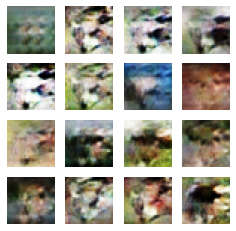

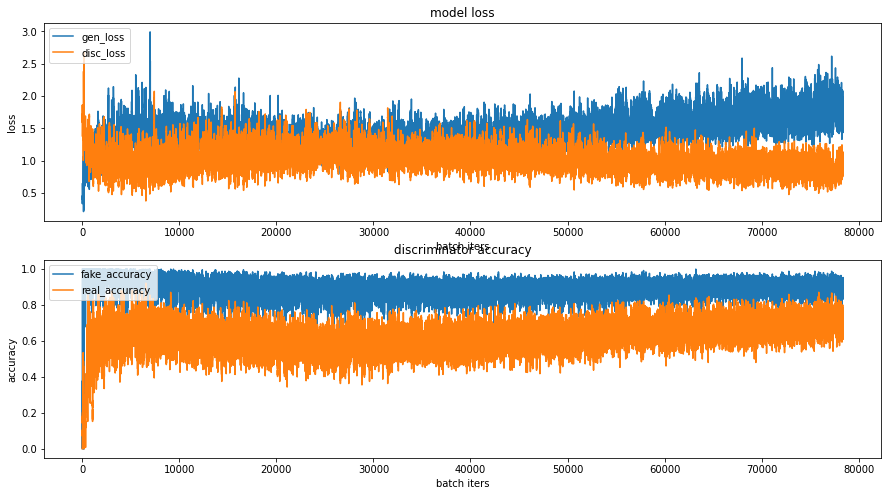

생성자에 레이어를 한 층 더 쌓고 조금 더 많이 돌렸더니 fake accuracy가 살짝 내려갈듯 말듯 하는 느낌으로 나타났다

real의 loss와 accuracy의 상태가 조금 개선된 듯 한 느낌이지만 그냥 많이 돌려서인지 모델 성능이 나아진 건지 알 수 없다

출력 이미지에서는 언뜻 보기엔 어렴풋한 형체가 보이긴 하는데..

대부분 비슷한 모양이라는게 마음에 걸려서 (에폭이 진행되면 갈라질 수도 있겠지만)

초기 lr을 조절하고, 이전의 결과가 영향을 미치는 수치인 $\beta_1$을 낮춰서 관성을 줄여보기로 함

목표는 fake의 accuracy가 충분히 낮아지는지 추적하고 싶은건데, 주황색 그래프에 가려서 안 보일까봐 순서도 바꿔줌

---
---

> Modified + 히스토리 그래프 순서 변경 ( 주황색이 0.5가 되어야 좋음)

> 모델 구성 관련
>- DEPTH = 64
>- DIM = 4
>- DROPOUT = 0.3
>- G_init = 2e-4
>- D_init = 1e-3
>- BETA_1 = 0.5

> 학습 관련
>- save_every = 5
>- EPOCHS = 100

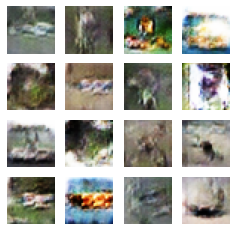


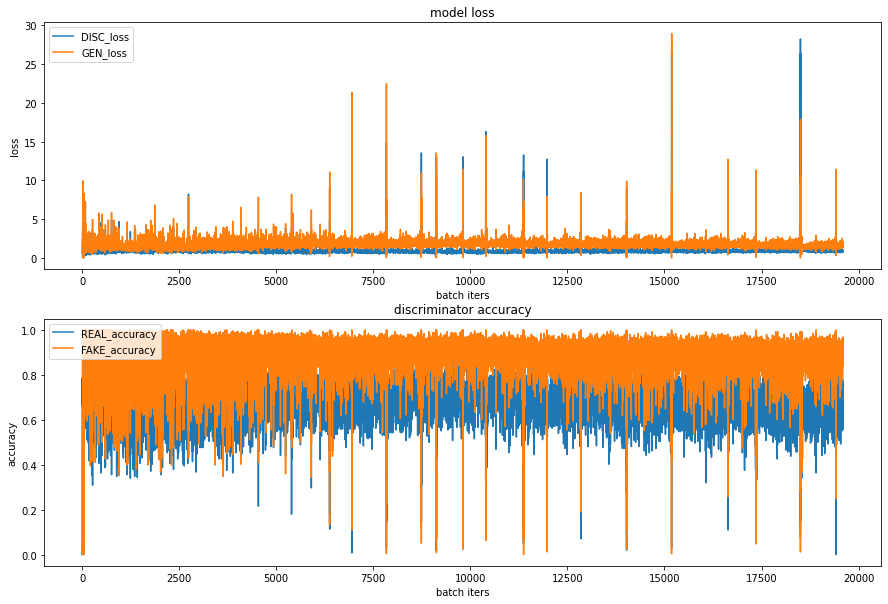

초기 lr을 키워서 출력 결과가 이리저리 튀기를 기대했고, 기대한 것 만큼은 나온 것 같다.

16개의 사진이 적당히 다양하게 뿌려져 있어서 그건 마음에 드는데

생성자를 멍청하게 만드는 김에 판별자의 상태도 좀 너프 시켰더니 아주 바보가 되었다

전체적으로 0.5 에 수렴하는 형태를 원하지 간헐적 바보를 원하는게 아냐....

배치 사이즈를 키우고 lr에 decay를 적용해보기로 함

---
---

> Modified ver.

>데이터셋 구성 관련
>- BUFFER_SIZE = 50000 # 전체 데이터 셋 크기만큼 설정
>- BATCH_SIZE = 512    # 한번에 학습할 데이터의 양

>모델 구성 관련
>- DIM, DEPTH = 4, 64
>- DROPOUT = 0.3
>- G_init, D_init, DECAY = 1e-4, 1e-3, 1e-5

>학습 관련
>- save_every = 100
>- EPOCHS = 1000


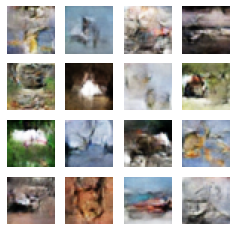


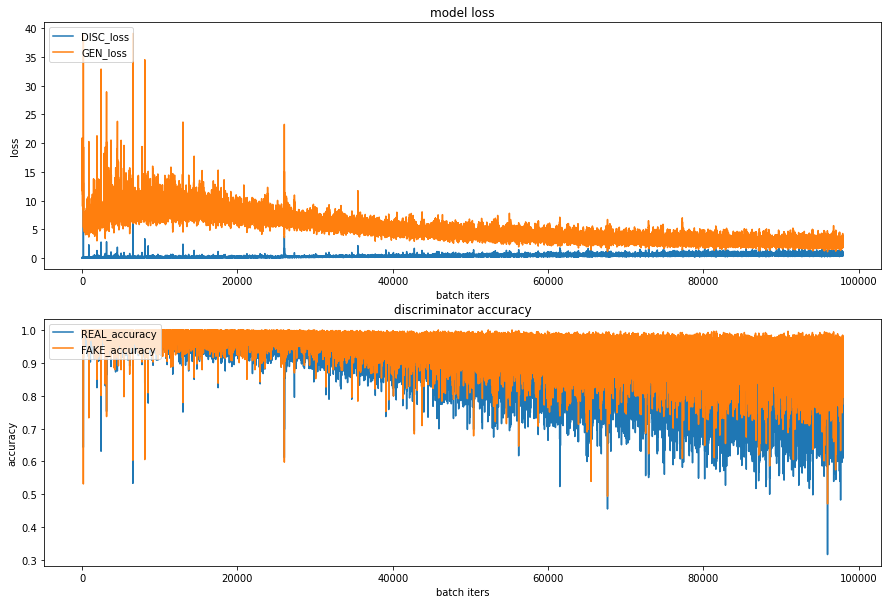

천번 단위로는 돌려야 무슨 모양이 나오긴 나오는구나..

(2,4)에 고양이 형상이나 (4,2)에 말은 비교적 정확하게 보인다

그 외에도 다른 샘플도 어떤 객체를 생성하고 있는 걸 확인할 수 있고

한 500에폭을 지나면서 loss 는 안정되고 있다!

fake를 보고 싶은데 real이 fake 그래프를 가려서 순서를 바꿨더니 계속 헷갈린다..

초반 백번 정도에는 판별자의 lr이 커서 바보짓을 하긴 하는데 accuracy가 0 까지 떨어지지는 않고 있다.

decay 집어넣어봤는데 gif를 보니 효과가 있어보인다.

처음에는 미친듯이 뛰다가 후반에선 완성되어 가는 형체들을 다듬어주는 모양.

아직까지 판별자가 fake accuracy 1의 끈을 놓지 못하고 있지만 점점 흘러내리는 걸로 보아 희망이 있어보인다!


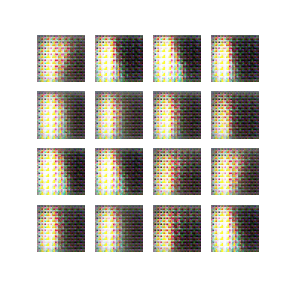

In [32]:
from IPython.display import Image

# 50번이 아닌 100번마다 저장함
Image(os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/cifar10_dcgan1.gif)

![](cifar10_dcgan1.gif)

이 결과물로 이어서 다시 천번을 돌리면 어떨까 싶어서 진행해봄!

#### 체크포인트 로드 하기

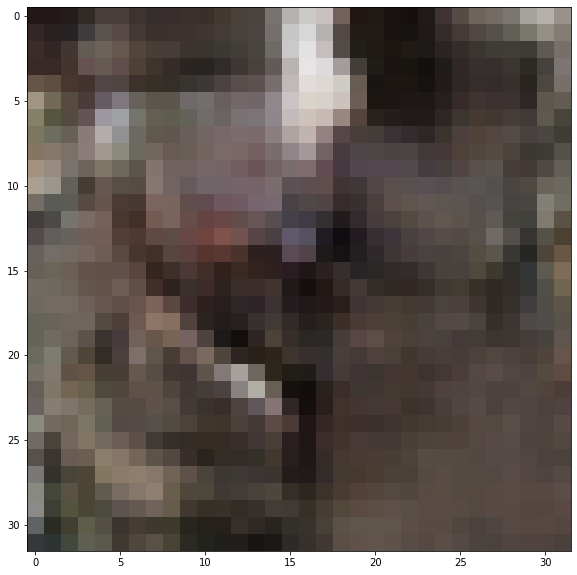

In [105]:
checkpoint_dir = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/training_checkpoints'

latest = tf.train.latest_checkpoint(checkpoint_dir)
checkpoint.restore(latest)

generator = checkpoint.generator
discriminator = checkpoint.discriminator

# 로드한 모델이 정상적으로 이미지를 생성하는지 확인해 봅니다. 
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

np_generated = generated_image.numpy()
np_generated = (np_generated * 127.5) + 127.5   # reverse of normalization
np_generated = np_generated.astype(int)
plt.imshow(np_generated[0])
plt.show()  # 정상적으로 모델이 로드되었다면 랜덤 이미지가 아니라 CIFAR-10 이미지가 그려질 것입니다.

In [106]:
# 최적화 함수만 조절한 후 이어서 학습
generator_optimizer = tf.keras.optimizers.Adam(5e-5, decay=DECAY)
discriminator_optimizer = tf.keras.optimizers.Adam(5e-4, decay=DECAY)

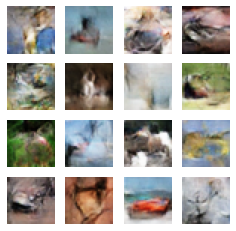

Epoch 514 | iter 1
Time for epoch 514 : 2 sec


KeyboardInterrupt: 

In [107]:
%%time
train(train_dataset, EPOCHS, save_every)

decay로 인해서 lr이 생각보다 많이 줄어들었었나보다 ㅠㅠ

그걸 감안해서 초기 lr을 재설정 해줬는데도 이전 학습에서는 뚜렷해지는 방향으로 정리되던게, 

다시 뿌옇게 흐려지는 모습을 보고 눈물이 차올라서 중단.

잘 만들어진 말이 아깝지만 아예 새롭게 다시 돌리면서 LeakyReLU의 $\alpha$ 값을 0.2로 변경해봄

어떤 영향이 있을지는 잘 모르겠는데 다른 자료들에서 종종 0.2가 보이길래 바꿔보았다

코랩과 클라우드를 왔다갔다 하면서 돌리다가 $\beta_1$ 설정을 빼먹었다는걸 깨닫고

다시 할때는 집어넣어야지 했었는데.. 체크포인트 어쩌고 하다가 다음번도 까먹었다... ^^..

## 마지막 학습 결과

>Modified ver.

>데이터셋 구성 관련
>- BUFFER_SIZE = 50000             # 전체 데이터 셋 크기만큼 설정
>- BATCH_SIZE = 512                # 한번에 학습할 데이터의 양

>모델 구성 관련
>- DIM, DEPTH = 4, 64
>- DROPOUT = 0.3                   # 생성자
>- ALPHA = 0.2                     # LeakyReLU
>- G_init, D_init,  = 1e-4, 1e-3 
>- DECAY = 0.5, 1e-5               #decay: 업데이트마다 적용되는 학습률의 감소율

>학습 관련
>- save_every = 100                # 100번마다 checkpoint
>- EPOCHS = 2000                   # 학습횟수

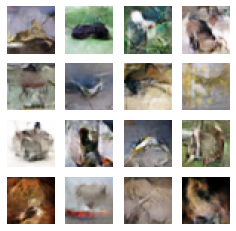

Time for training : 82983 sec


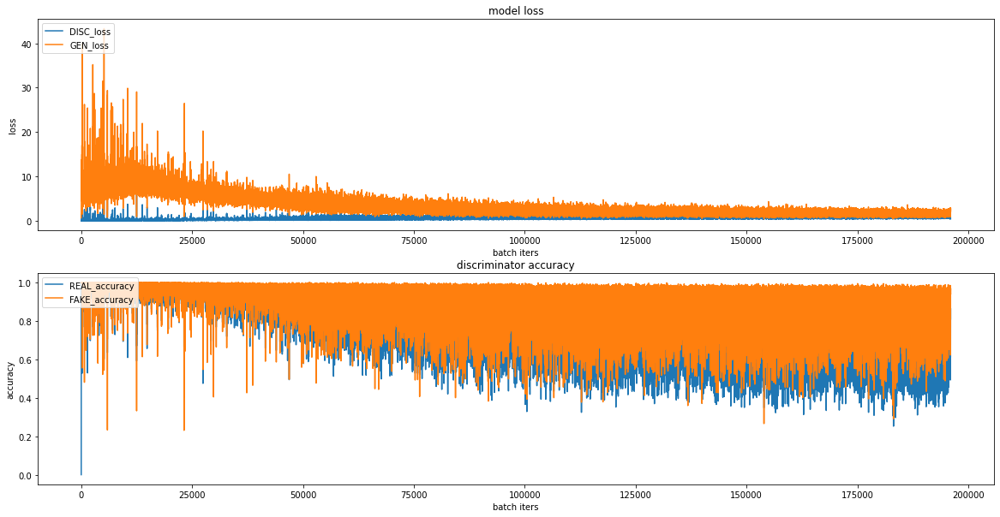

CPU times: user 23h 1min 47s, sys: 13min 55s, total: 23h 15min 42s
Wall time: 23h 3min 10s


In [27]:
%%time
train(train_dataset, EPOCHS, save_every)

### 결과 시각화 하기

In [30]:
anim_file = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/cifar10_dcgan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('{}/aiffel/dcgan_newimage/cifar10/generated_samples/sample*.png'.format(os.getenv('HOME')))
    filenames = sorted(filenames)
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

!ls -l ~/aiffel/dcgan_newimage/cifar10/cifar10_dcgan.gif

-rw-r--r-- 1 root root 3881882 Aug 30 18:28 /aiffel/aiffel/dcgan_newimage/cifar10/cifar10_dcgan.gif


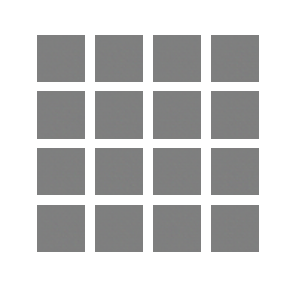

In [33]:
Image(os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/cifar10_dcgan.gif')

![](cifar10_dcgan.gif)

# 회고

생물학 전공인거 너무 티나긴 하는데 이 노드에서는 자연선택의 느낌이 난다~야호~

천번짜리 돌렸을 때 말이 나왔다고 엄청 기뻐서 방방 뛰었지만

다른 환경에서 다시 학습을 시작하니 형체가 뭉게지면서 다른 방향을 찾아가는걸 보면서

역시 ~우리가 기대하듯이~ 어떤 형태를 목적으로 수렴을 하는 건 아니구나

(이건 분명 강아지일 수 밖에 없다! 확신했지만 어느샌가 치타 같은게 되어있었고..)

주어진 환경에서 가장 best인 조합을 찾아가는 것 뿐이고

결과적으로 우리 눈에 특정한 객체처럼 보일 뿐인 거구나.

갑자기 전공 뽕이 막 차오르면서 강화학습에 대한 관심이 확 생기기도 하고..

유전적 알고리즘으로 생성자를 구현하면 어떨까 싶어서

관련 자료를 찾아보기는 했는데 실제로 구현은 시도도 못해봤다... 다음기회에!

---

솔직히 accuracy가 너무.. 이해가 잘 안돼서?

여러 자료를 찾아봤는데 GAN에는 공식적으로 accuracy 판단 절차가 없고,

여러 연구로 추가된 버전이라도 이렇게 무식한 방법으로 판단하지는 않았다..

어쨌든 알게 된 점은 accuracy 자체가 중요한 기준은 아니고, 

사람이 보기에 얼마나 그럴 듯 한 결과가 나오느냐 가 중요해서, 괜찮다 싶으면 중단시키면 된다는 것 같다.

중간까지 타조나 칠면조? 같은 느낌이었던 이미지가 마지막엔 뭔지 알수 없어져서 아깝다...

---

그 외에 매우 흥미로웠던 점은.. ~그냥 우연일 지도 모르겠지만~

비행기나 자동차, 선박같은 형태가 생각보다 잘 안 만들어진다는 거였다.

아니면 만들어져도 인식하기 힘든 수준이라거나..?

자연물과 인공물의 차이인걸까? 제로베이스에서 만들어내기엔 자연스럽지 않은 형태라서 그런걸까...

---

마지막에 이천번짜리로 진짜 완전 제대로 된거, 천번짜리 말보다 예쁜거!!!!

만들어서 마무리 짓겠다고 월요일 노드도 포기하고 돌렸는데

결과는 그닥.. 이천번 만큼 돌릴 건 아니었던 것 같다 ^^

loss 나 accurracy는 천번 정도에서 적당히 수렴하고 있고,

이미지는 적당히 예쁜 모양이 나오는가 싶더니 계속 다듬다가 어느새 알 수 없는 모양이 되어버린다.. 

![](GAN.png)

이렇게 만든 데이터를 cifar 분류기에 넣어보고 싶었는데

만들어진 이미지를 데이터셋화 시키는 방법을 좀 더 찾아봐야겠다.